# Amazon Sales Data Analysis

# Importing Libraries:

In [3]:

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

import warnings
warnings.filterwarnings('ignore')

# Importing the dataset:

In [4]:

amz_sales = pd.read_excel("C:/Users/91964/Downloads/ETL-20230919T031811Z-001/ETL/amz_salesdata.xlsx")

In [3]:
# Show 1st 10 records

amz_sales.head(10)

,CustKey,DateKey,Discount Amount,Invoice Date,Invoice Number,Item Class,Item Number,Item,Line Number,List Price,Order Number,Promised Delivery Date,Sales Amount,Sales Amount Based on List Price,Sales Cost Amount,Sales Margin Amount,Sales Price,Sales Quantity,Sales Rep
0,10007564,2017-01-05,273.04,2017-01-05,329967,P01,63945,American Beef Bologna,10000,25.14,124295,2017-01-05,229.76,502.8,164.36,65.40,11.488000,20,166
1,10007591,2017-02-08,392.18,2017-02-08,122224,P01,63945,American Beef Bologna,18000,25.14,218219,2017-02-08,362.02,754.2,246.54,115.48,12.067333,30,185
2,10004256,2019-02-19,406.66,2019-02-19,322224,P01,63945,American Beef Bologna,18000,25.14,118219,2019-02-19,347.54,754.2,246.54,101.00,11.584667,30,185
3,10007591,2017-08-08,392.18,2017-08-08,109841,P01,63945,American Beef Bologna,18000,25.14,207623,2017-08-08,362.02,754.2,246.54,115.48,12.067333,30,185
4,10004256,2019-08-20,NaN,2019-08-20,309841,P01,63945,American Beef Bologna,18000,25.14,107623,2019-08-20,347.54,754.2,246.54,101.00,11.584667,30,185
5,10017036,2017-10-22,406.66,2017-10-22,116457,P01,63945,American Beef Bologna,10000,25.14,213205,2017-10-22,239.33,502.8,164.36,74.97,11.966500,20,166
6,10007564,2019-11-03,273.04,2019-11-03,316457,P01,63945,American Beef Bologna,10000,25.14,113205,2019-11-03,229.76,502.8,164.36,65.40,11.488000,20,166
7,10017036,2017-12-24,263.47,2017-12-24,129967,P01,63945,American Beef Bologna,10000,25.14,224295,2017-12-24,239.33,502.8,164.36,74.97,11.966500,20,166
8,10009672,2018-01-31,381.32,2018-01-31,222224,P01,63945,American Beef Bologna,18000,25.14,318219,2018-01-31,372.88,754.2,246.54,126.34,12.429333,30,185
9,10020515,2017-01-03,188.92,2017-01-03,329729,P01,63653,American Chicken Hot Dogs,1000,199.00,123081,2017-01-03,209.08,398.0,68.78,140.30,104.540000,2,143


In [4]:
# Show last 10 records

amz_sales.tail(10)

,CustKey,DateKey,Discount Amount,Invoice Date,Invoice Number,Item Class,Item Number,Item,Line Number,List Price,Order Number,Promised Delivery Date,Sales Amount,Sales Amount Based on List Price,Sales Cost Amount,Sales Margin Amount,Sales Price,Sales Quantity,Sales Rep
65272,10022423,2017-09-03,456.48,2017-09-03,112099,NaN,39856,Washington Strawberry Drink,1000,570.60,210061,2017-09-03,684.72,1141.2,377.42,307.30,342.3600,2,127
65273,10017054,2019-09-15,483.87,2019-09-15,312099,NaN,39856,Washington Strawberry Drink,1000,570.60,110061,2019-09-15,657.33,1141.2,377.42,279.91,328.6650,2,127
65274,10016858,2017-09-29,13226.59,2017-09-29,114382,NaN,30359,Washington Strawberry Drink,2000,1226.22,210745,2017-09-29,11297.81,24524.4,7402.94,3894.87,564.8905,20,159
65275,10021175,2019-10-11,13678.50,2019-10-11,314382,NaN,30359,Washington Strawberry Drink,2000,1226.22,110745,2019-10-11,10845.90,24524.4,7402.94,3442.96,542.2950,20,159
65276,10021470,2017-10-27,2485.08,2017-10-27,116846,NaN,39856,Washington Strawberry Drink,28000,570.60,212267,2017-10-27,3220.92,5706.0,1826.03,1394.89,322.0920,10,145
65277,10026055,2019-11-08,2613.92,2019-11-08,316846,NaN,39856,Washington Strawberry Drink,28000,570.60,112267,2019-11-08,3092.08,5706.0,1826.03,1266.05,309.2080,10,145
65278,10016858,2017-12-01,13226.59,2017-12-01,127934,NaN,30359,Washington Strawberry Drink,2000,1226.22,222233,2017-12-01,11297.81,24524.4,7402.94,3894.87,564.8905,20,159
65279,10021175,2019-12-13,13678.50,2019-12-13,327934,NaN,30359,Washington Strawberry Drink,2000,1226.22,122233,2019-12-13,10845.90,24524.4,7402.94,3442.96,542.2950,20,159
65280,10021470,2017-12-29,2485.08,2017-12-29,130353,NaN,39856,Washington Strawberry Drink,28000,570.60,223544,2017-12-29,3220.92,5706.0,1826.03,1394.89,322.0920,10,145
65281,10025251,2018-02-26,435.94,2018-02-26,224433,NaN,39856,Washington Strawberry Drink,1000,570.60,320291,2018-02-26,705.26,1141.2,377.42,327.84,352.6300,2,127


In [21]:
# Show total number of rows and columns in data set

amz_sales.shape

(65282, 19)

In [4]:
# Show basic information of dataframe like null value count of each column and their data type 

amz_sales.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 65282 entries, 0 to 65281
Data columns (total 19 columns):
 #   Column                            Non-Null Count  Dtype         
---  ------                            --------------  -----         
 0   CustKey                           65282 non-null  int64         
 1   DateKey                           65282 non-null  datetime64[ns]
 2   Discount Amount                   65279 non-null  float64       
 3   Invoice Date                      65282 non-null  datetime64[ns]
 4   Invoice Number                    65282 non-null  int64         
 5   Item Class                        56993 non-null  object        
 6   Item Number                       65241 non-null  object        
 7   Item                              65282 non-null  object        
 8   Line Number                       65282 non-null  int64         
 9   List Price                        65282 non-null  float64       
 10  Order Number                      65282 non-nu

In [5]:
# Show columns present in dataframe

amz_sales.columns

Index(['CustKey', 'DateKey', 'Discount Amount', 'Invoice Date',
       'Invoice Number', 'Item Class', 'Item Number', 'Item', 'Line Number',
       'List Price', 'Order Number', 'Promised Delivery Date', 'Sales Amount',
       'Sales Amount Based on List Price', 'Sales Cost Amount',
       'Sales Margin Amount', 'Sales Price', 'Sales Quantity', 'Sales Rep'],
      dtype='object')

In [6]:
# Generating descriptive statistics

amz_sales.describe()

,CustKey,Discount Amount,Invoice Number,Line Number,List Price,Order Number,Sales Amount,Sales Amount Based on List Price,Sales Cost Amount,Sales Margin Amount,Sales Price,Sales Quantity,Sales Rep
count,6.528200e+04,65279.000000,65282.000000,65282.000000,65282.000000,65282.000000,65282.000000,65282.000000,65282.000000,65282.000000,65281.000000,65282.000000,65282.000000
mean,1.001770e+07,1855.599224,216223.662020,23713.849790,514.693380,180583.064352,2852.038373,4707.473613,1660.979228,1191.059145,283.615913,45.084311,137.422398
std,7.176148e+03,9037.207960,94992.281866,32664.024053,449.189182,67593.871116,15164.342107,20696.443785,9556.485250,5860.787502,252.876719,429.661793,26.643936
min,1.000045e+07,-255820.800000,100012.000000,1000.000000,0.000000,100838.000000,200.010000,0.000000,0.000000,-3932.930000,-5000.000000,-1.000000,103.000000
25%,1.001272e+07,246.035000,117931.000000,3000.000000,181.560000,115321.000000,308.387500,561.040000,167.790000,129.950000,100.070000,2.000000,113.000000
50%,1.001966e+07,441.760000,222869.500000,12000.000000,325.190000,203702.000000,553.940000,998.160000,304.500000,246.490000,183.757500,3.000000,134.000000
75%,1.002351e+07,999.760000,314318.750000,32000.000000,803.860000,218576.000000,1280.042500,2315.040000,687.320000,579.530000,448.220000,8.000000,160.000000
max,1.002758e+07,343532.660000,332842.000000,344000.000000,2760.700000,321532.000000,555376.000000,632610.160000,366576.000000,188800.000000,6035.000000,16000.000000,185.000000


In [7]:
# checking for any missing values

amz_sales.isnull().sum()

CustKey                                0
DateKey                                0
Discount Amount                        3
Invoice Date                           0
Invoice Number                         0
Item Class                          8289
Item Number                           41
Item                                   0
Line Number                            0
List Price                             0
Order Number                           0
Promised Delivery Date                 0
Sales Amount                           0
Sales Amount Based on List Price       0
Sales Cost Amount                      0
Sales Margin Amount                    0
Sales Price                            1
Sales Quantity                         0
Sales Rep                              0
dtype: int64

In [5]:
df = amz_sales.copy()

In [6]:
# Removing Null Values

df.dropna(inplace=True)

In [7]:
# Checking out total null value in the all the column of dataframe 

df.isnull().sum()

CustKey                             0
DateKey                             0
Discount Amount                     0
Invoice Date                        0
Invoice Number                      0
Item Class                          0
Item Number                         0
Item                                0
Line Number                         0
List Price                          0
Order Number                        0
Promised Delivery Date              0
Sales Amount                        0
Sales Amount Based on List Price    0
Sales Cost Amount                   0
Sales Margin Amount                 0
Sales Price                         0
Sales Quantity                      0
Sales Rep                           0
dtype: int64

observation: There is no missing values in the dataset

In [12]:
# Show total number of rows and columns in data set

df.shape

(56992, 19)

In [13]:
# Show 1st 10 records

df.head(10)

,CustKey,DateKey,Discount Amount,Invoice Date,Invoice Number,Item Class,Item Number,Item,Line Number,List Price,Order Number,Promised Delivery Date,Sales Amount,Sales Amount Based on List Price,Sales Cost Amount,Sales Margin Amount,Sales Price,Sales Quantity,Sales Rep
0,10007564,2017-01-05,273.04,2017-01-05,329967,P01,63945,American Beef Bologna,10000,25.14,124295,2017-01-05,229.76,502.8,164.36,65.40,11.488000,20,166
1,10007591,2017-02-08,392.18,2017-02-08,122224,P01,63945,American Beef Bologna,18000,25.14,218219,2017-02-08,362.02,754.2,246.54,115.48,12.067333,30,185
2,10004256,2019-02-19,406.66,2019-02-19,322224,P01,63945,American Beef Bologna,18000,25.14,118219,2019-02-19,347.54,754.2,246.54,101.00,11.584667,30,185
3,10007591,2017-08-08,392.18,2017-08-08,109841,P01,63945,American Beef Bologna,18000,25.14,207623,2017-08-08,362.02,754.2,246.54,115.48,12.067333,30,185
5,10017036,2017-10-22,406.66,2017-10-22,116457,P01,63945,American Beef Bologna,10000,25.14,213205,2017-10-22,239.33,502.8,164.36,74.97,11.966500,20,166
6,10007564,2019-11-03,273.04,2019-11-03,316457,P01,63945,American Beef Bologna,10000,25.14,113205,2019-11-03,229.76,502.8,164.36,65.40,11.488000,20,166
7,10017036,2017-12-24,263.47,2017-12-24,129967,P01,63945,American Beef Bologna,10000,25.14,224295,2017-12-24,239.33,502.8,164.36,74.97,11.966500,20,166
8,10009672,2018-01-31,381.32,2018-01-31,222224,P01,63945,American Beef Bologna,18000,25.14,318219,2018-01-31,372.88,754.2,246.54,126.34,12.429333,30,185
9,10020515,2017-01-03,188.92,2017-01-03,329729,P01,63653,American Chicken Hot Dogs,1000,199.00,123081,2017-01-03,209.08,398.0,68.78,140.30,104.540000,2,143
10,10020672,2017-01-05,402.94,2017-01-05,329928,P01,63653,American Chicken Hot Dogs,155000,199.00,122025,2017-01-05,393.06,796.0,137.55,255.51,98.265000,4,125


In [14]:
# checking dimensions

df.ndim

2

In [5]:
df.Item.value_counts().sort_values(ascending = False)

Better Fancy Canned Sardines    1648
Ebony Prepared Salad            1471
Moms Sliced Turkey              1192
Imagine Popsicles               1191
Discover Manicotti              1126
                                ... 
Imagine Fajita French Fries        1
High Top Mushrooms                 1
Great Bagels                       1
Bravo Fancy Canned Sardines        1
High Top Shitake Mushrooms         1
Name: Item, Length: 657, dtype: int64

In [15]:
# Creating year,month,quarter,day

df['Invoice_Year'] = amz_sales['Invoice Date'].dt.year
df['Invoice_Month'] = amz_sales['Invoice Date'].dt.month
df['Invoice_Quarter'] = amz_sales['Invoice Date'].dt.quarter
df['Invoice_Day'] = amz_sales['Invoice Date'].dt.day

In [16]:
df.head(5)

,CustKey,DateKey,Discount Amount,Invoice Date,Invoice Number,Item Class,Item Number,Item,Line Number,List Price,...,Sales Amount Based on List Price,Sales Cost Amount,Sales Margin Amount,Sales Price,Sales Quantity,Sales Rep,Invoice_Year,Invoice_Month,Invoice_Quarter,Invoice_Day
0,10007564,2017-01-05,273.04,2017-01-05,329967,P01,63945,American Beef Bologna,10000,25.14,...,502.8,164.36,65.40,11.488000,20,166,2017,1,1,5
1,10007591,2017-02-08,392.18,2017-02-08,122224,P01,63945,American Beef Bologna,18000,25.14,...,754.2,246.54,115.48,12.067333,30,185,2017,2,1,8
2,10004256,2019-02-19,406.66,2019-02-19,322224,P01,63945,American Beef Bologna,18000,25.14,...,754.2,246.54,101.00,11.584667,30,185,2019,2,1,19
3,10007591,2017-08-08,392.18,2017-08-08,109841,P01,63945,American Beef Bologna,18000,25.14,...,754.2,246.54,115.48,12.067333,30,185,2017,8,3,8
5,10017036,2017-10-22,406.66,2017-10-22,116457,P01,63945,American Beef Bologna,10000,25.14,...,502.8,164.36,74.97,11.966500,20,166,2017,10,4,22


# Exploratory data analysis:

# Yearly sales record:

In [17]:

Yearly_Sales =  df[['CustKey','Item','Invoice Date','Invoice_Year','Invoice_Month',
                            'Sales Quantity', 'Sales Amount Based on List Price','Discount Amount',
                           'Sales Amount', 'Sales Margin Amount','Sales Cost Amount','Sales Rep','List Price',
                           'Sales Price']]

,Invoice_Year,Sales Amount
0,2017,44366481.94
1,2018,10191632.53
2,2019,39809238.30


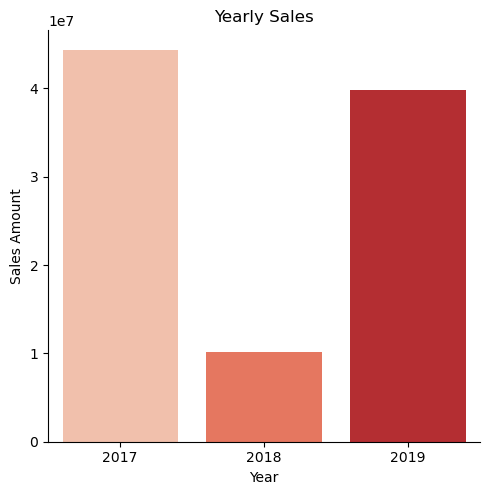

In [20]:
# plotting bar charts

Yearly_Sales1 = Yearly_Sales.groupby('Invoice_Year').sum().reset_index()
sns.catplot(y = 'Sales Amount', x = 'Invoice_Year', data = Yearly_Sales1, palette='Reds',kind="bar")
plt.xlabel('Year')
plt.ylabel('Sales Amount')
plt.title('Yearly Sales')
Yearly_Sales1[['Invoice_Year', 'Sales Amount']]

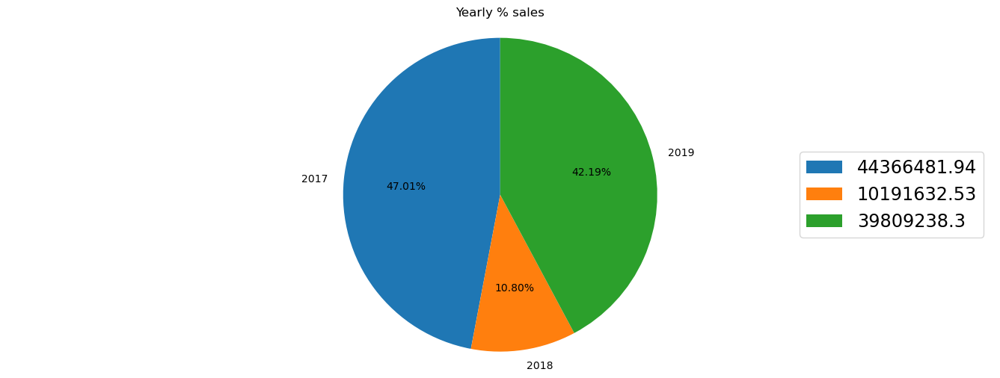

In [19]:
# Plotting Piechart to know Sales Share among 3 years

plt.figure(figsize=(17,6))
plt.pie('Sales Amount',labels='Invoice_Year',data=Yearly_Sales1,autopct='%1.2f%%',startangle=90)
plt.axis('equal')
plt.title('Yearly % sales')
plt.legend(round(Yearly_Sales1['Sales Amount'],2), loc=7, fontsize = 'xx-large')
plt.show()

Observations:
From 2017-19 Highest Sales Amount 2017>2019>2018.

<Axes: xlabel='Invoice_Month', ylabel='Sales Amount'>

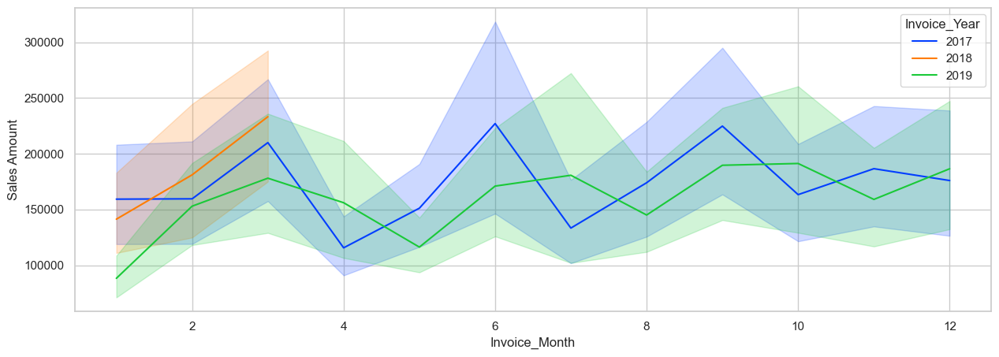

In [21]:
# plotting a line chart 


plt.figure(figsize = (15,5))
sns.set(style="whitegrid")
sns.lineplot(y ='Sales Amount', x = 'Invoice_Month',data= df.groupby(['Invoice Date','Invoice_Year','Invoice_Month']).sum(),
             hue = 'Invoice_Year', palette='bright')

Obseravtions:
From this plot, it is clear that Sales decreased continuously & then it started to increase from 2018 to 2019.

Text(0, 0.5, 'Count')

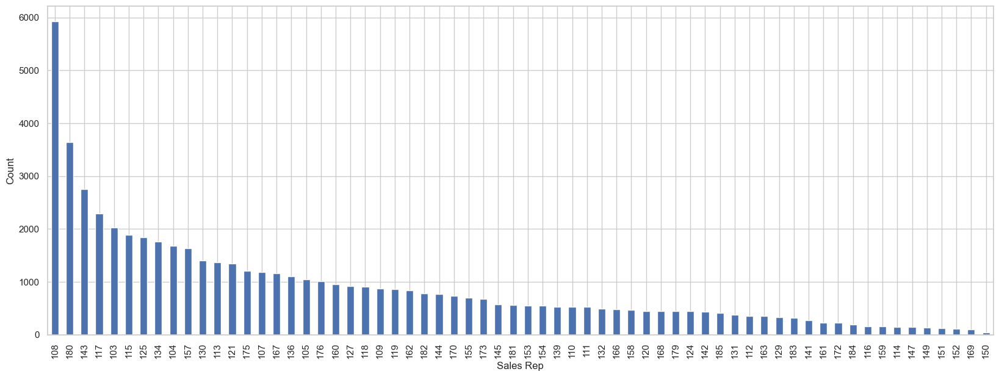

In [22]:
plt.figure(figsize=(20, 7))
df['Sales Rep'].value_counts().plot.bar()
plt.xlabel('Sales Rep')
plt.ylabel('Count')

Observations: Sales Rep "108" were used most often while sales rep "150" has been used the least.

# Yearly-Monthwise Records:

In [23]:

Yearly_Monthwise_Sales = df.groupby(['Invoice_Year','Invoice_Month']).sum().reset_index()

In [24]:
Yearly_Monthwise_Sales.describe(include='all')

,Invoice_Year,Invoice_Month,CustKey,Discount Amount,Invoice Number,Line Number,List Price,Order Number,Sales Amount,Sales Amount Based on List Price,Sales Cost Amount,Sales Margin Amount,Sales Price,Sales Quantity,Sales Rep,Invoice_Quarter,Invoice_Day
count,27.000000,27.000000,2.700000e+01,2.700000e+01,2.700000e+01,2.700000e+01,2.700000e+01,2.700000e+01,2.700000e+01,2.700000e+01,2.700000e+01,2.700000e+01,27.000000,27.000000,27.000000,27.000000,27.000000
mean,2018.000000,6.000000,2.114526e+10,3.221987e+06,4.567927e+08,5.190255e+07,1.131969e+06,3.809286e+08,3.495087e+06,6.717069e+06,1.954500e+06,1.540588e+06,612808.242649,20772.777778,288532.074074,5090.962963,34191.333333
std,0.960769,3.626823,3.544250e+09,7.765400e+05,2.037377e+08,1.295569e+07,1.872953e+05,1.530547e+08,7.805173e+05,1.538599e+06,4.339300e+05,3.570436e+05,101511.104791,4783.414297,47751.391103,2911.390356,6466.045076
min,2017.000000,1.000000,8.564731e+09,1.049756e+06,1.949045e+08,1.840623e+07,4.677337e+05,9.980985e+07,1.059905e+06,2.109661e+06,6.125274e+05,4.473781e+05,249520.379216,6800.000000,114865.000000,855.000000,18372.000000
25%,2017.000000,3.000000,1.909747e+10,2.928168e+06,2.717792e+08,4.201525e+07,1.052987e+06,2.420125e+08,3.183607e+06,6.029945e+06,1.756477e+06,1.391554e+06,562739.267350,18138.000000,263746.500000,2240.000000,29697.500000
50%,2018.000000,6.000000,2.179748e+10,3.409501e+06,4.272474e+08,5.508823e+07,1.158130e+06,3.724654e+08,3.614629e+06,7.098143e+06,2.004976e+06,1.618149e+06,613192.126928,21526.000000,303346.000000,4928.000000,35006.000000
75%,2019.000000,9.000000,2.334125e+10,3.719361e+06,6.536021e+08,6.177419e+07,1.232610e+06,5.074003e+08,3.983550e+06,7.734747e+06,2.248869e+06,1.727767e+06,665598.501081,24522.000000,317385.500000,7170.000000,39517.000000
max,2019.000000,12.000000,2.569623e+10,4.466614e+06,8.306302e+08,7.135424e+07,1.401929e+06,6.528293e+08,4.996062e+06,9.462676e+06,2.791841e+06,2.204222e+06,760472.906623,26824.000000,347729.000000,10124.000000,44026.000000


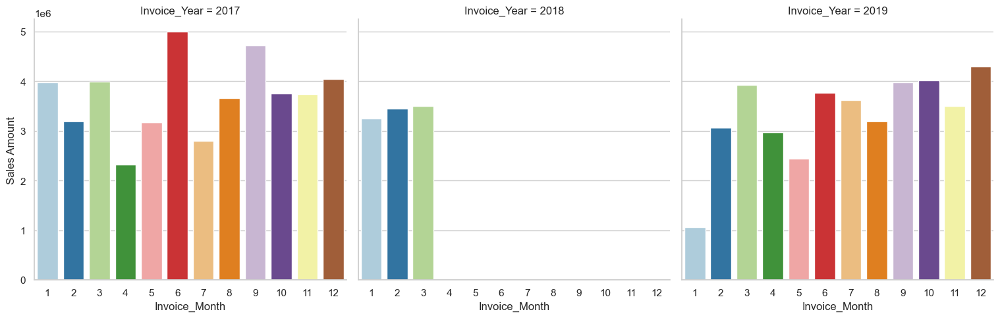

In [25]:
# Plotting Catplot

sns.catplot(y = 'Sales Amount', x = 'Invoice_Month', data = Yearly_Monthwise_Sales, palette='Paired',kind="bar",
            col='Invoice_Year', col_wrap=7)

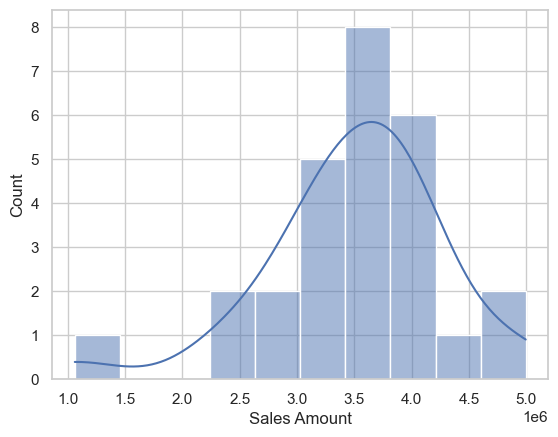

In [26]:
# Plotting Histplot

sns.histplot(Yearly_Monthwise_Sales['Sales Amount'],bins=10,kde = True)
sns.set_style('darkgrid')
plt.show()

**************************************************Yearly-Monthwise Sales Trend**************************************************


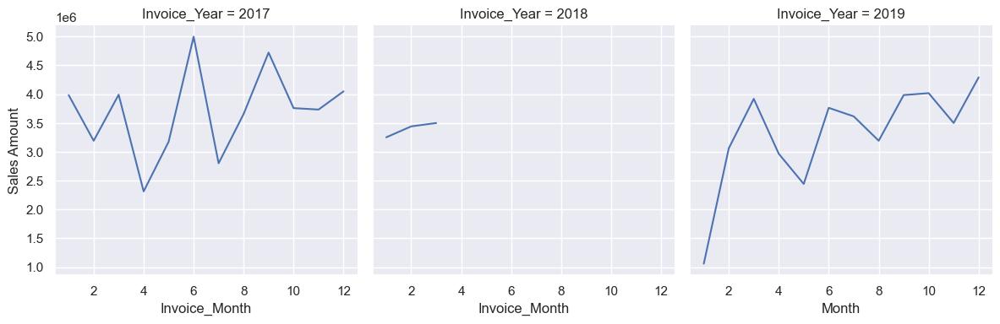

In [27]:
# creating relational plots


sns.relplot(x ='Invoice_Month',y = 'Sales Amount', data=Yearly_Monthwise_Sales,height=4,kind = 'line',
            aspect = 1, col = 'Invoice_Year')
plt.xlabel('Month')
plt.ylabel('Sales Amount')
print('*'*50+'Yearly-Monthwise Sales Trend'+'*'*50)

# Monthly Records:

In [28]:

monthly_sales= df.groupby(['Invoice_Month','Invoice_Year','Invoice_Day','Invoice_Quarter']).sum().reset_index()
monthly_sales.describe(include='all')

,Invoice_Month,Invoice_Year,Invoice_Day,Invoice_Quarter,CustKey,Discount Amount,Invoice Number,Line Number,List Price,Order Number,Sales Amount,Sales Amount Based on List Price,Sales Cost Amount,Sales Margin Amount,Sales Price,Sales Quantity,Sales Rep
count,558.000000,558.000000,558.000000,558.000000,5.580000e+02,558.000000,5.580000e+02,5.580000e+02,558.000000,5.580000e+02,558.000000,5.580000e+02,558.000000,558.000000,558.000000,558.000000,558.000000
mean,6.163082,2017.980287,15.767025,2.385305,1.023158e+09,155902.583975,2.210287e+07,2.511413e+06,54772.680309,1.843203e+07,169117.119659,3.250194e+05,94572.558978,74544.560681,29652.011741,1005.134409,13961.229391
std,3.578351,0.948194,8.742035,1.157413,5.407219e+08,122140.725004,1.570951e+07,2.560917e+06,29693.935699,1.234388e+07,126406.386262,2.473572e+05,70836.969918,56781.494056,15910.742183,748.201490,7406.766131
min,1.000000,2017.000000,1.000000,1.000000,3.005291e+07,4304.025000,3.133500e+05,1.200000e+04,2033.880000,3.122850e+05,4665.240000,9.163645e+03,3084.290000,1575.160000,1063.117667,27.000000,345.000000
25%,3.000000,2017.000000,8.000000,1.000000,6.137395e+08,71452.787600,1.099452e+07,1.007501e+06,34688.921200,9.776364e+06,80044.900000,1.506528e+05,43750.120000,35326.010000,19336.198599,430.750000,8456.500000
50%,6.000000,2018.000000,16.000000,2.000000,9.366532e+08,114773.285600,1.804381e+07,1.718001e+06,47969.726350,1.477855e+07,126461.365000,2.412151e+05,70162.140000,57504.490000,26166.933832,815.000000,12665.000000
75%,9.000000,2019.000000,23.000000,3.000000,1.289581e+09,195881.205000,2.935515e+07,3.068754e+06,66365.164925,2.374281e+07,209836.742500,3.984934e+05,122667.925000,92903.677500,36929.901214,1314.000000,17699.000000
max,12.000000,2019.000000,31.000000,4.000000,4.368721e+09,686169.353100,1.311671e+08,1.941501e+07,222047.790800,8.923137e+07,723493.530000,1.382251e+06,406437.780000,319882.020000,121499.433452,3957.000000,52775.000000


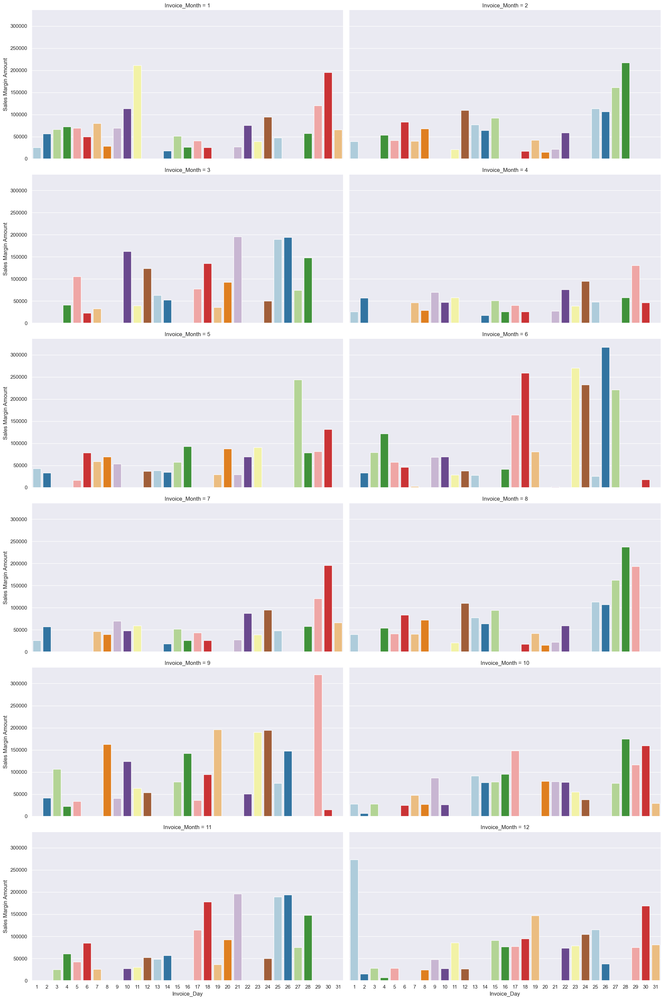

In [29]:
# creating catplot

sns.catplot(y = 'Sales Margin Amount', x = 'Invoice_Day', data = monthly_sales[monthly_sales['Invoice_Year'] == 2017], aspect=2,
            palette='Paired',kind="bar",col='Invoice_Month', col_wrap=2)

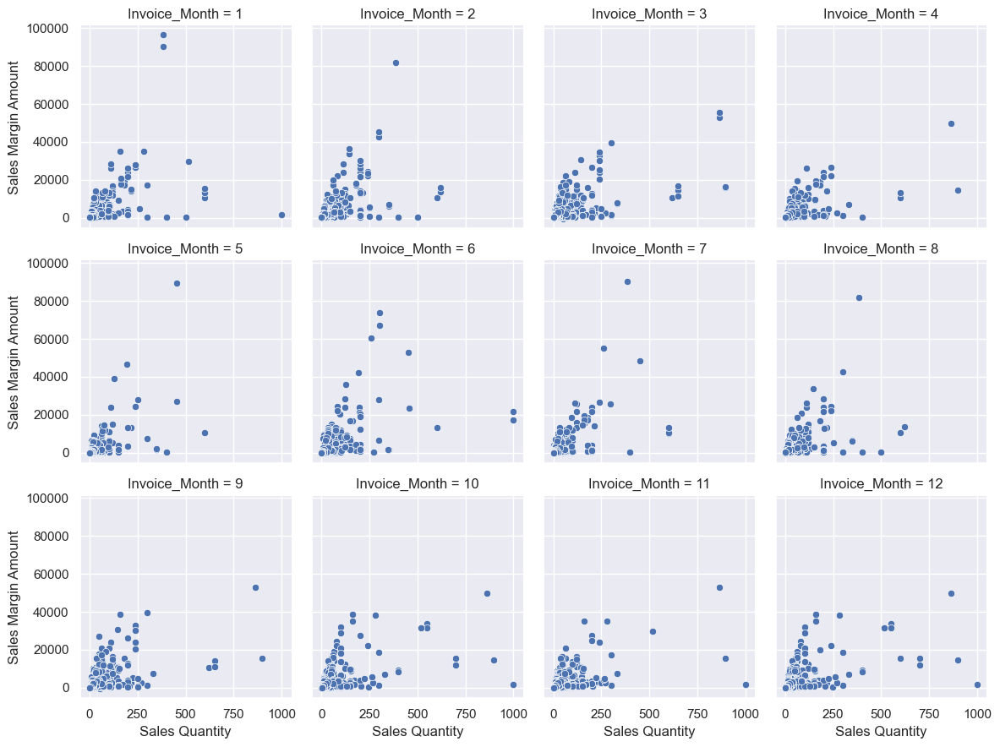

In [30]:
sns.relplot(x = 'Sales Quantity',y = 'Sales Margin Amount', data=df, height = 3,aspect=1,col = 'Invoice_Month',
            col_wrap = 4, palette='muted')

**************************************************Monthly Sales Trend in 2017**************************************************


<Figure size 800x2000 with 0 Axes>

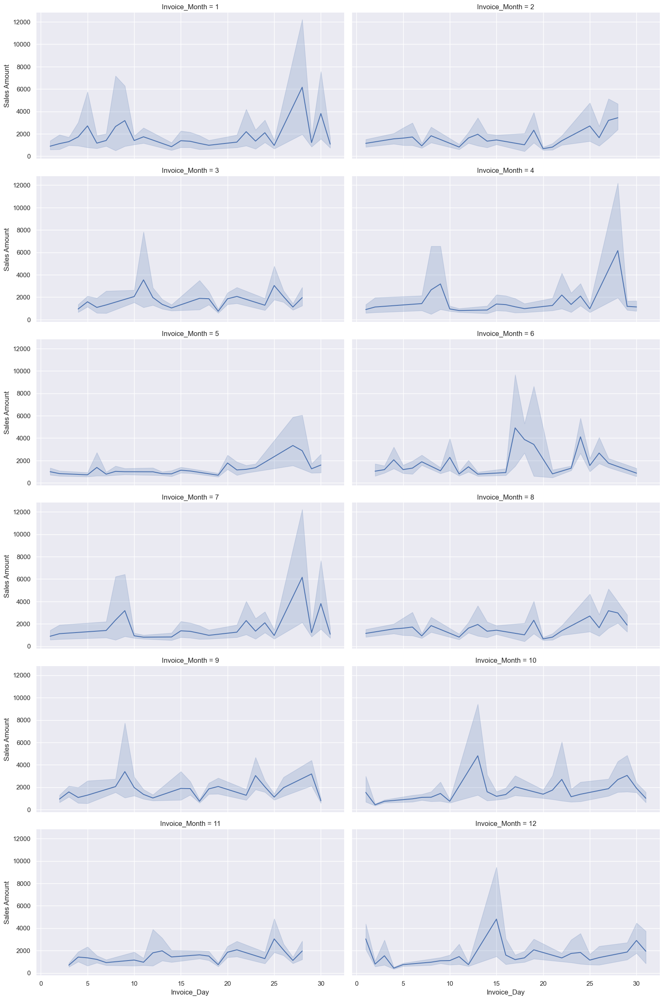

In [31]:
plt.figure(figsize=(8, 20))
sns.relplot(x ='Invoice_Day',y = 'Sales Amount', data= df.query('Invoice_Year == 2017'), kind = 'line', 
            col = 'Invoice_Month', col_wrap =2, height = 4, aspect = 2)
plt.ylabel('Sales Amount')
print('*'*50+'Monthly Sales Trend in 2017'+'*'*50)

**************************************************Monthly Sales Trend in 2018**************************************************


<Figure size 800x2000 with 0 Axes>

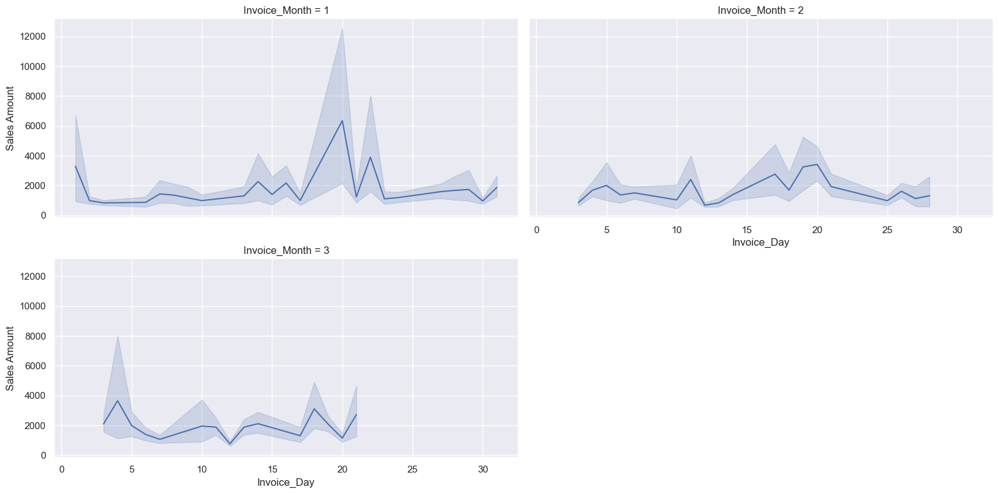

In [32]:
plt.figure(figsize=(8, 20))
sns.relplot(x ='Invoice_Day',y = 'Sales Amount', data= df.query('Invoice_Year == 2018'), kind = 'line', 
            col = 'Invoice_Month', col_wrap =2, height = 4, aspect = 2)
plt.ylabel('Sales Amount')
print('*'*50+'Monthly Sales Trend in 2018'+'*'*50)

**************************************************Monthly Sales Trend in 2019**************************************************


<Figure size 800x2000 with 0 Axes>

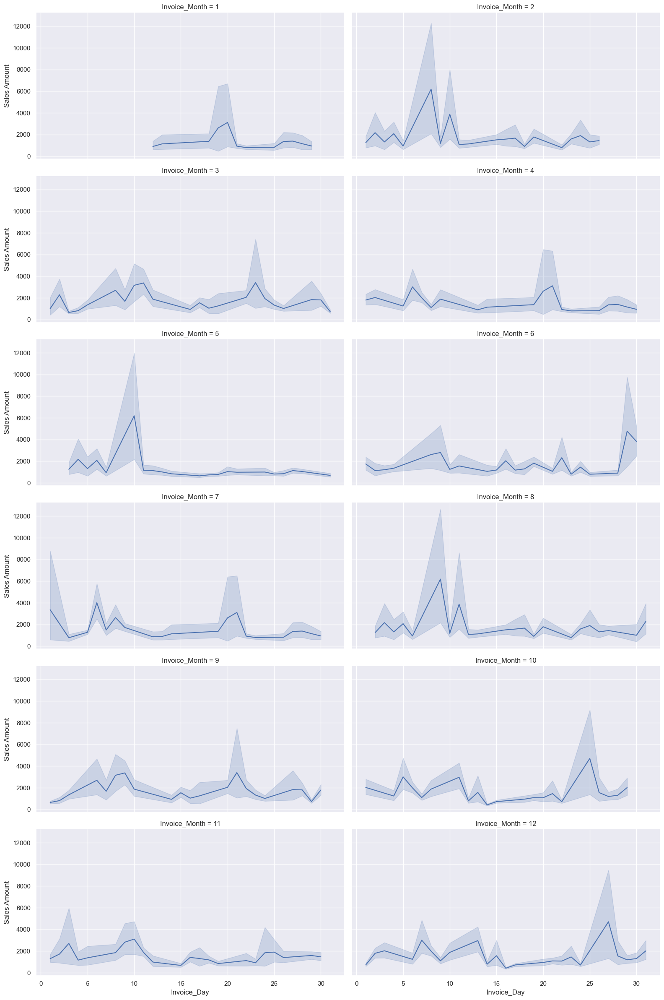

In [33]:
plt.figure(figsize=(8, 20))
sns.relplot(x ='Invoice_Day',y = 'Sales Amount', data= df.query('Invoice_Year == 2019'), kind = 'line', 
            col = 'Invoice_Month', col_wrap =2, height = 4, aspect = 2)
plt.ylabel('Sales Amount')
print('*'*50+'Monthly Sales Trend in 2019'+'*'*50)

# Profits Records:

,Invoice_Year,Sales Margin Amount
0,2017,19943019.42
1,2018,4773022.21
2,2019,16879823.23


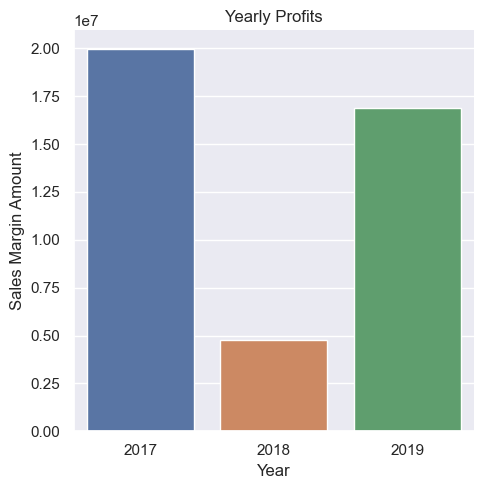

In [34]:

sns.catplot(y = 'Sales Margin Amount', x = 'Invoice_Year', data = Yearly_Sales1 ,kind="bar")
plt.xlabel('Year')
plt.ylabel('Sales Margin Amount')
plt.title('Yearly Profits')
Yearly_Sales1[['Invoice_Year', 'Sales Margin Amount']]

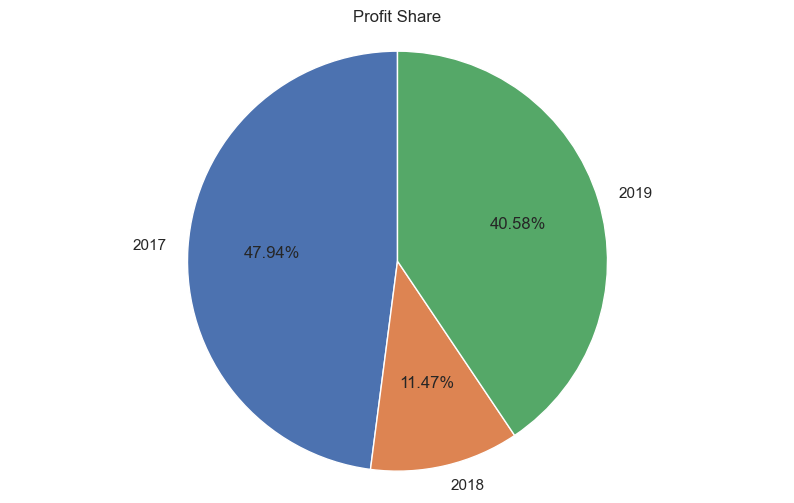

In [35]:
# creating pie chart

plt.figure(figsize=(10,6))
plt.pie('Sales Margin Amount',labels='Invoice_Year',data=Yearly_Sales1[['Invoice_Year', 'Sales Margin Amount']],
        autopct='%1.2f%%',startangle=90)
plt.axis('equal')
plt.title('Profit Share')
plt.show()

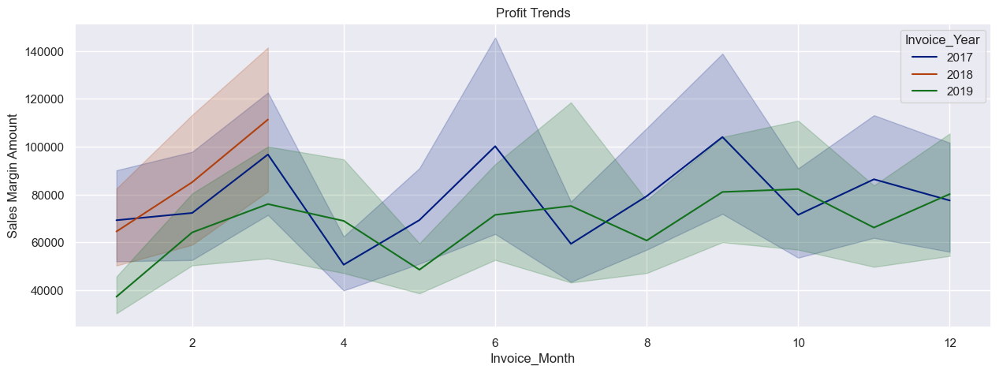

In [36]:
# creating line graph

plt.figure(figsize = (15,5))
sns.lineplot(y ='Sales Margin Amount', x = 'Invoice_Month', 
             data= df.groupby(['Invoice Date','Invoice_Year','Invoice_Month']).sum(),hue = 'Invoice_Year', 
             palette='dark')
plt.title('Profit Trends')
plt.show()

<Axes: >

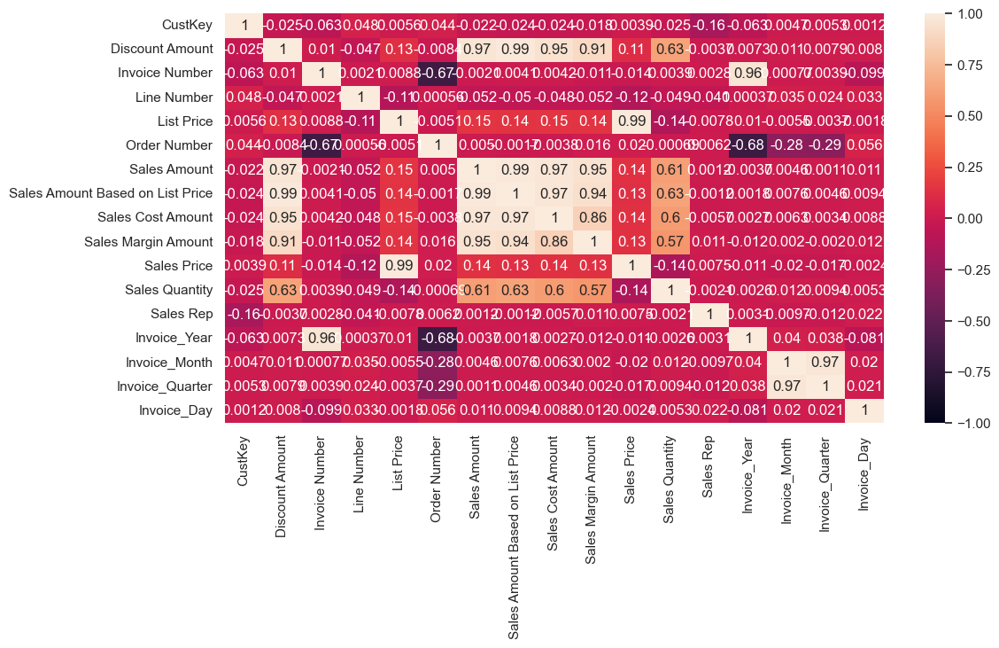

In [37]:
# Checking the correlation

plt.figure(figsize=(12,6))
sns.heatmap(df.corr(method='pearson'),annot= True,vmin=-1,vmax=1)

# Observations:
1- Discount Amount is highly related to Sales Amount, Sales Cost Amount, Sales Amount Based on List Price & Sales Margin Amount and moderately related to Sales Quantity.

2- List Price highly related to sales price and has no relations with Sales amount, Sales cost amount, Sales amount based on list price & sales margin amount.

3- Sales quantity is moderately related to Sales amount, discount amount, sales margin amount.

4- Their is no relation Between Sales Rep and Sales Amount, Sales Margin Amount.

# Top 10 Records:

In [38]:
# 2017
Top10byCustKey17 = Yearly_Sales[Yearly_Sales['Invoice_Year']==2017].groupby(['Invoice_Year','CustKey']).sum()
Top10byCustKey17 = Top10byCustKey17.sort_values('Sales Margin Amount', ascending=False).reset_index().head(10)

,CustKey,Sales Margin Amount
0,10025919,1370941.86
1,10009606,810513.45
2,10012715,752711.45
3,10021485,702237.63
4,10027370,618304.77
5,10016588,522173.71
6,10023715,486265.62
7,10009356,476947.99
8,10020181,427777.71
9,10007134,415018.06


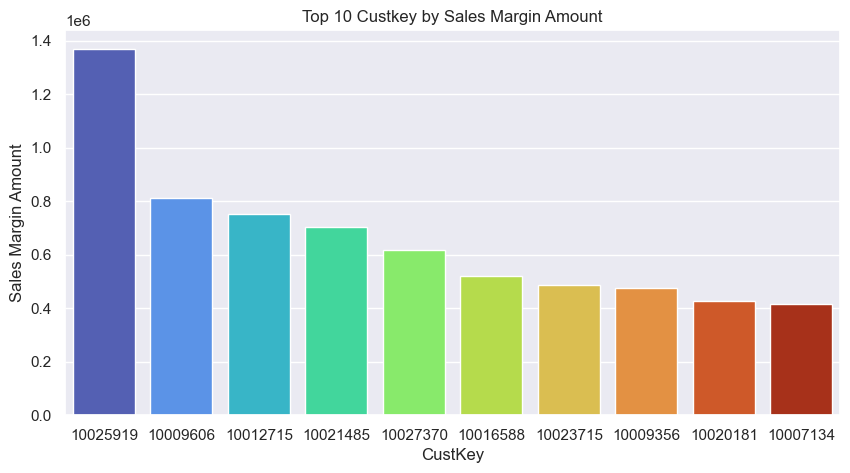

In [39]:
plt.figure(figsize=(10,5))
sns.barplot(x='CustKey', y='Sales Margin Amount',data = Top10byCustKey17, palette = 'turbo',
            order = Top10byCustKey17.CustKey)
plt.title('Top 10 Custkey by Sales Margin Amount')
Top10byCustKey17[['CustKey', 'Sales Margin Amount']]

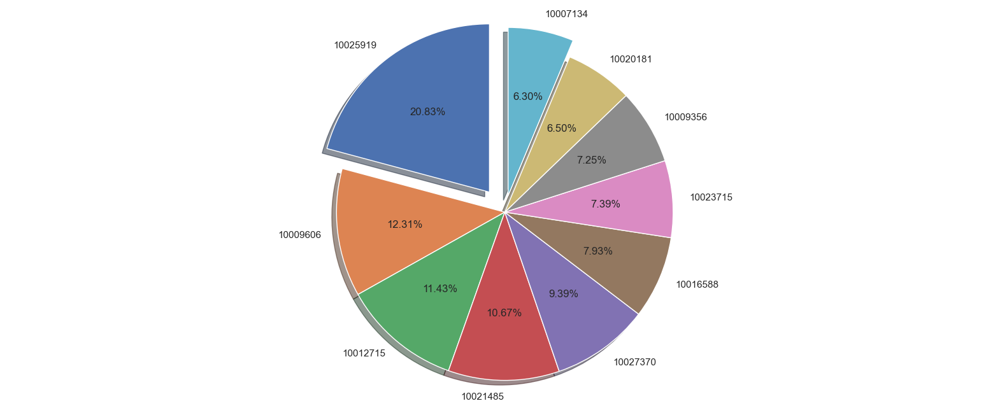

In [40]:
plt.figure(figsize=(20,8))
plt.pie('Sales Margin Amount',labels='CustKey',data=Top10byCustKey17,
        autopct='%1.2f%%',shadow=True,startangle=90, explode = (0.15, 0, 0, 0, 0, 0, 0, 0, 0, 0.1))
plt.axis('equal')
plt.show()

Observations:
Among the 10 CustKey that generated the most Sales Margin Amount, CustKey-10025919 contributed around 20.83% of the Sales Margin Amountin 2017.

In [41]:
# 2018

Top10byCustKey18 = Yearly_Sales[Yearly_Sales['Invoice_Year']==2018].groupby(['Invoice_Year','CustKey']).sum()
Top10byCustKey18 = Top10byCustKey18.sort_values('Sales Margin Amount', ascending=False).reset_index().head(10)

,CustKey,Sales Margin Amount
0,10017638,225191.89
1,10019066,198324.21
2,10025039,188204.87
3,10007183,160451.82
4,10010923,149746.16
5,10010935,147940.18
6,10026299,143395.68
7,10021804,137294.10
8,10023275,128032.44
9,10002161,105317.03


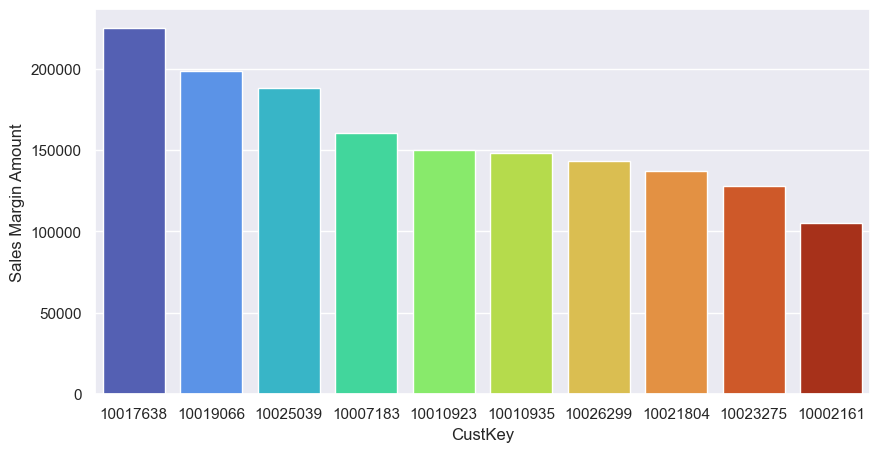

In [42]:
plt.figure(figsize=(10,5))
sns.barplot(x='CustKey', y='Sales Margin Amount',data = Top10byCustKey18, palette = 'turbo',
            order = Top10byCustKey18.CustKey)
Top10byCustKey18[['CustKey', 'Sales Margin Amount']]

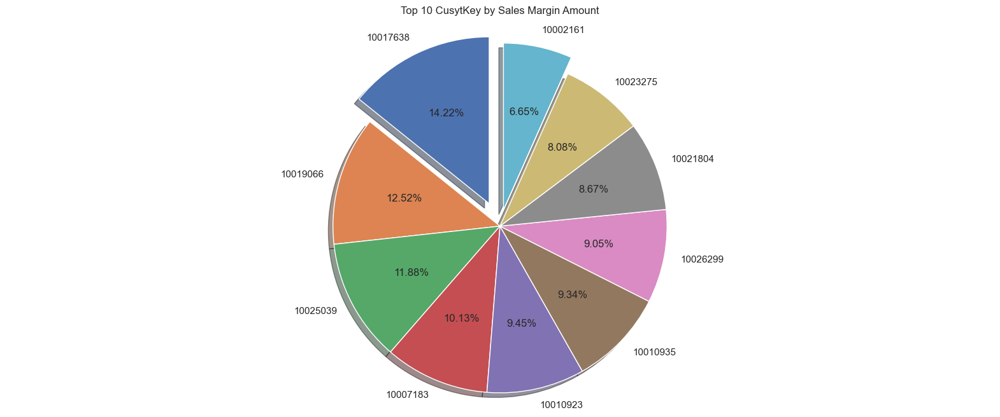

In [43]:
plt.figure(figsize=(20,8))
plt.pie('Sales Margin Amount',labels='CustKey',data=Top10byCustKey18,autopct='%1.2f%%',
        shadow=True,startangle=90, explode = (0.15, 0, 0, 0, 0, 0, 0, 0, 0, 0.1))
plt.axis('equal')
plt.title('Top 10 CusytKey by Sales Margin Amount')
plt.show()

Observations: Among the 10 CustKey that generated the most Sales Margin Amount, CustKey-10017638 contributed around 14.22% of the Sales Margin Amount in 2018.

In [44]:
# 2019

Top10byCustKey19 = Yearly_Sales[Yearly_Sales['Invoice_Year']==2019].groupby(['Invoice_Year','CustKey']).sum()
Top10byCustKey19 = Top10byCustKey19.sort_values('Sales Margin Amount', ascending=False).reset_index().head(10)

,CustKey,Sales Margin Amount
0,10019194,1183669.60
1,10012226,676221.46
2,10016548,663605.66
3,10009676,582194.67
4,10026365,496804.79
5,10022456,468926.16
6,10004245,421782.20
7,10025778,419128.61
8,10023275,384363.18
9,10015793,377439.90


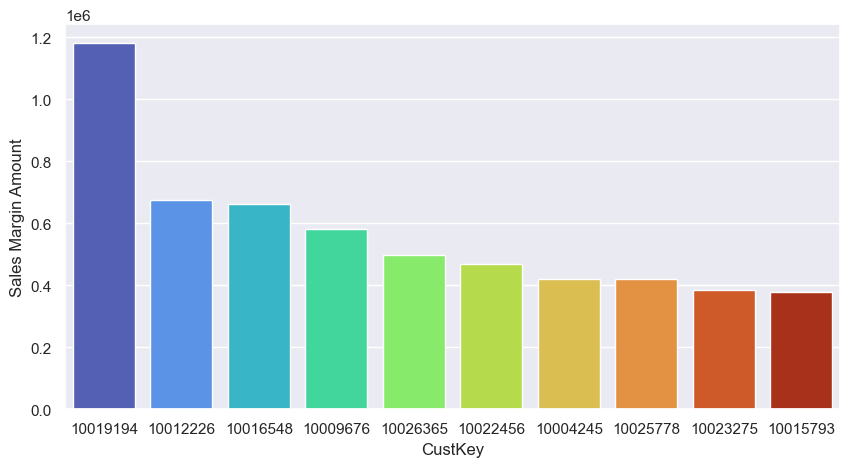

In [45]:
plt.figure(figsize=(10,5))
sns.barplot(x='CustKey', y='Sales Margin Amount',data = Top10byCustKey19, palette = 'turbo',
            order = Top10byCustKey19.CustKey)
Top10byCustKey19[['CustKey', 'Sales Margin Amount']]

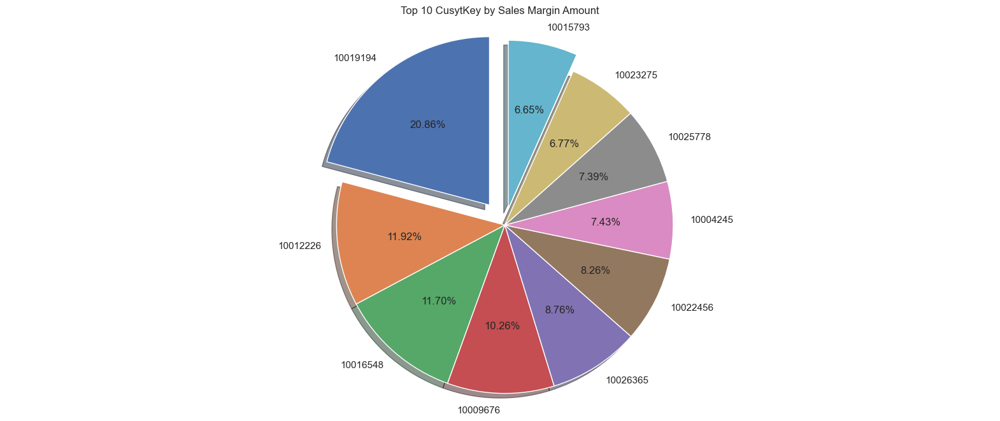

In [47]:
plt.figure(figsize=(20,8))
plt.pie('Sales Margin Amount',labels='CustKey',data=Top10byCustKey19,autopct='%1.2f%%',
        shadow=True,startangle=90, explode = (0.15, 0, 0, 0, 0, 0, 0, 0, 0, 0.1))
plt.axis('equal')
plt.title('Top 10 CusytKey by Sales Margin Amount')
plt.show()

Observations: Among the 10 CustKey that generated the most Sales Margin Amount, CustKey-10019194 contributed around 20.86% of the Sales Margin Amount in 2019.

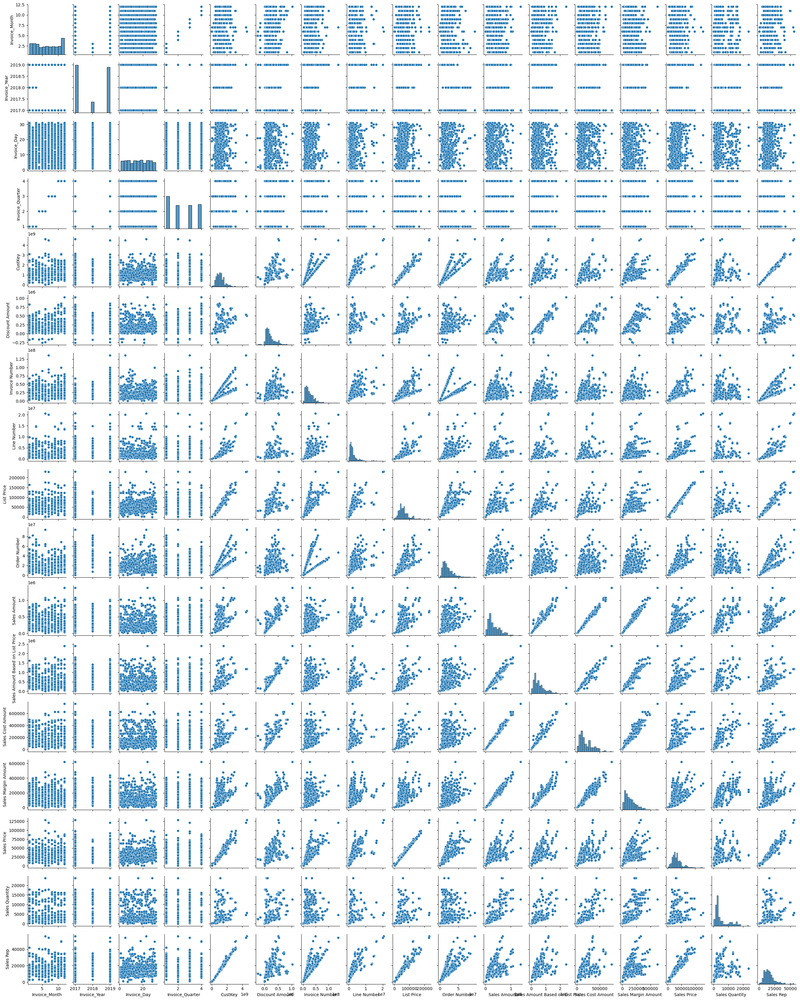

In [26]:
sns.pairplot(monthly_sales, height = 2, aspect = 0.8)

Observations:

As seen from the pairplot above, it is quite clear that list price is very strongly positively correlated with sales price.

A strong correlation exists between sales amount, sales cost amount, sales margin amount, and sales amount based on list price.

Sales amount, sales cost amount, and sales margin amount are strongly correlated with discount amount.

Sales quantity is moderately positively correlated to sales amount, sales cost amount, sales margin amount and sales amount based on list price.

Sales cost amount and sales margin amount are strongly positively correlated.

Customer key and sales rep are weakly negatively correlated.

Sales price and sales quantity are weakly negatively correlated.

Sales quantity and sales rep are very weakly negatively correlated.

Sales rep is very weakly negatively correlated to both discount amount and sales cost amount.

Sales rep is very weakly positively correlated to sales margin amount, in fact we can claim them to be independent of each other as well.

# Automated EDA:

In [8]:
from pandas_profiling import ProfileReport

In [9]:
from pandas_profiling.profile_report import ProfileReport

In [10]:
profile = ProfileReport(df,explorative=True, dark_mode=True)

In [11]:
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]